# core

> Fill in a module description here

In [ ]:
#| default_exp core

In [ ]:
#| hide
from nbdev.showdoc import *
from IPython.display import HTML, clear_output, display
%reload_ext autoreload
%autoreload 2

# Imports

In [ ]:
#| export 
import torch
from torch import autocast
from torchvision import transforms as tfms

from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging

from diffusers.models import AutoencoderKL, UNet2DConditionModel
from diffusers.schedulers import (
    EulerAncestralDiscreteScheduler, 
    LMSDiscreteScheduler
)
from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion import (
    StableDiffusionPipelineOutput, 
    StableDiffusionPipeline,
)
from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img import StableDiffusionImg2ImgPipeline

import io
import inspect
import requests
import random
from tqdm.auto import tqdm
import PIL
from matplotlib import pyplot as plt
import numpy as np
import base64
from typing import List, Union, Tuple, Dict, Any
from pprint import pprint

# serving
import pydantic

logging.set_verbosity_error()

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    # https://huggingface.co/docs/diffusers/optimization/mps
    device = "mps"
else:
    device = "cpu"
  

# Global variables

In [ ]:
#| export
HF_SD_MODEL = "runwayml/stable-diffusion-v1-5"
HF_CLIP_MODEL = "openai/clip-vit-large-patch14"

VAE_ENCODE_SCALE = 0.18215
VAE_DECODE_SCALE = 1 / VAE_ENCODE_SCALE

## API

In [ ]:
#| export
# CUSTOM_PARAMS_START = "custom_params_start"

# Initialization

## schedulers

In [ ]:
#| export
lms_scheduler = LMSDiscreteScheduler(
    beta_start=0.00085, 
    beta_end=0.012, 
    beta_schedule="scaled_linear", 
    num_train_timesteps=1000
)

euler_a_scheduler = EulerAncestralDiscreteScheduler.from_config(
    HF_SD_MODEL, subfolder="scheduler"
)

In [ ]:
#| export
SCHEDULERS = {
    "euler_a": euler_a_scheduler,
    "lms": lms_scheduler,
}

DEFAULT_SCHEDULER = euler_a_scheduler

## text2image pipe w/ fp16 & optim.

In [ ]:
#| export
if device == "mps":
    pipe = StableDiffusionPipeline.from_pretrained(
        HF_SD_MODEL, 
        scheduler=DEFAULT_SCHEDULER
    )
else:
    pipe = StableDiffusionPipeline.from_pretrained(
        HF_SD_MODEL, 
        torch_dtype=torch.float16, 
        revision="fp16",
        scheduler=DEFAULT_SCHEDULER
    )

pipe.safety_checker = None
pipe.to(device)
# pipe.enable_xformers_memory_efficient_attention()
pipe.enable_attention_slicing()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

## create pointers to main components in pipeline

In [ ]:
#| export
vae = pipe.vae
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
unet = pipe.unet
scheduler = pipe.scheduler
generator = torch.Generator()

## additional pipes

### i2i_pipe

- https://github.com/huggingface/diffusers/blob/main/docs/source/api/pipelines/overview.mdx#-diffusers-summary

In [ ]:
#| export
i2i_pipe = StableDiffusionImg2ImgPipeline(**pipe.components)

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/6 [00:00<?, ?it/s]

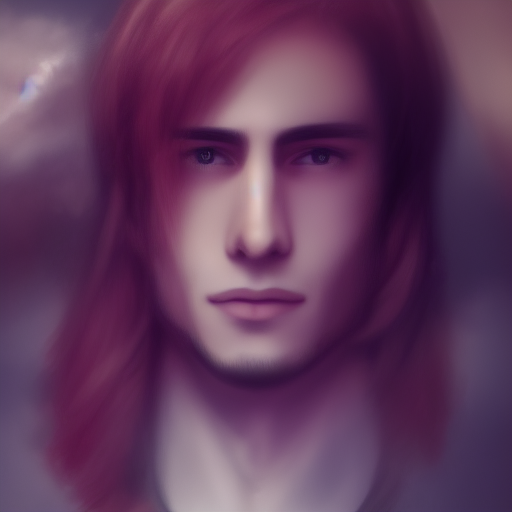

In [ ]:
#| server
torch.manual_seed(1627137983322845203)
img = PIL.Image.open("images/test_image.png")
pipe_out = i2i_pipe("handsome boy", init_image=img, num_inference_steps=10, strength=0.6)
pipe_out.images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

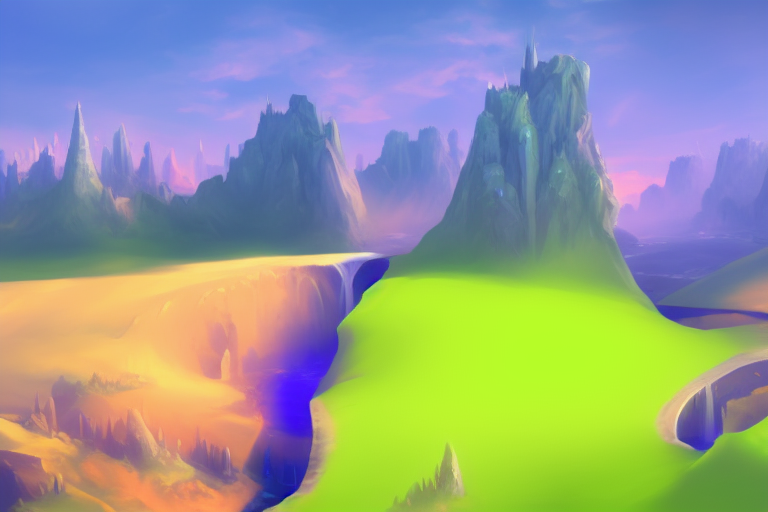

In [ ]:
#| server
torch.manual_seed(1024)

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

response = requests.get(url)
init_img = PIL.Image.open(io.BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((768, 512))
prompt = "A fantasy landscape, trending on artstation"

with autocast("cuda"):
    image = i2i_pipe(prompt=prompt, init_image=init_img, num_inference_steps=50,
                 strength=0.75, guidance_scale=7.5).images[0]

image

# Helpers

## pil_to_latents

In [ ]:
#| export
@torch.no_grad()
def pil_to_latents(im: PIL.Image.Image) -> torch.Tensor:
    """
    Transform single image into single latent in a batch w/ shape = (1, 4, 64, 64)
    """
    device = vae.device.type
    tensor = tfms.ToTensor()(im).unsqueeze(0).to(device)
    tensor = tensor * 2 - 1
    with torch.autocast(device):
        latent = vae.encode(tensor) 
    return VAE_ENCODE_SCALE * latent.latent_dist.sample()

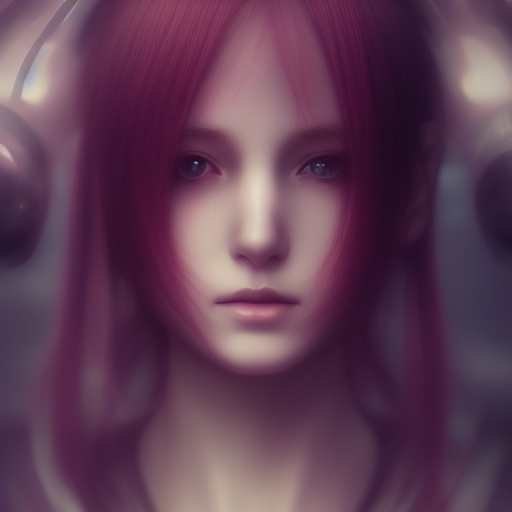

latent.shape: torch.Size([1, 4, 64, 64])


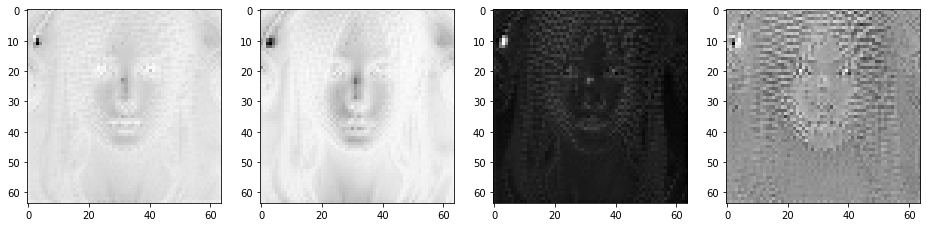

In [ ]:
#| server
im = PIL.Image.open("images/test_image.png")
display(im)
latents = pil_to_latents(im)
print(f"latent.shape: {latent.shape}")

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(latents[0][c].cpu(), cmap='Greys')

## latents_to_pil

In [ ]:
#| export
@torch.no_grad()
def latents_to_pil(latents: torch.Tensor) -> List[PIL.Image.Image]:
    """
    Transform batch of latent back to list of pil images
    - `latents`: shape(batch_size, channels, heights, width)
    """
    
    device = vae.device.type

    latents = latents.to(device)
    latents = VAE_DECODE_SCALE * latents
    
    with torch.autocast(device):
        ims = vae.decode(latents).sample
        
    ims = (ims / 2 + 0.5).clamp(0, 1)
    ims = ims.detach().cpu().permute(0, 2, 3, 1).numpy()
    ims = (ims * 255).round().astype("uint8")
    pil_ims = [PIL.Image.fromarray(im) for im in ims]
    return pil_ims

torch.Size([1, 4, 64, 64])


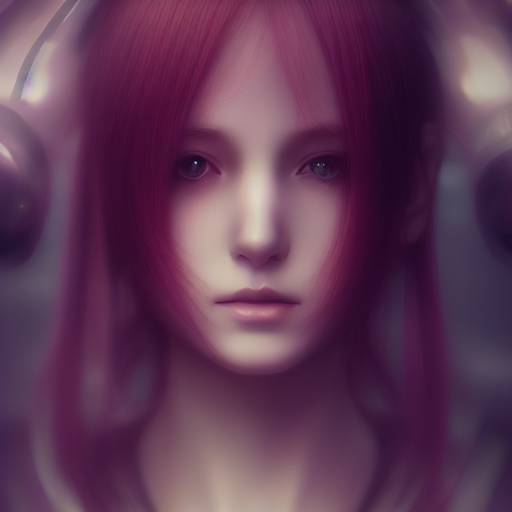

In [ ]:
#| server
print(latents.shape)
ims = latents_to_pil(latents)
ims[0]

## generate_image_grid

In [ ]:
#| export
def generate_image_grid(
    images: List[PIL.Image.Image], 
    nrow: int, 
    ncol: int):

    w, h = images[0].size # assume all images are of the same size
    grid = PIL.Image.new('RGB', size=(ncol * w, nrow * h))
    for i, im in enumerate(images): 
        grid.paste(im, box=(i % ncol * w, i // ncol * h))
    return grid

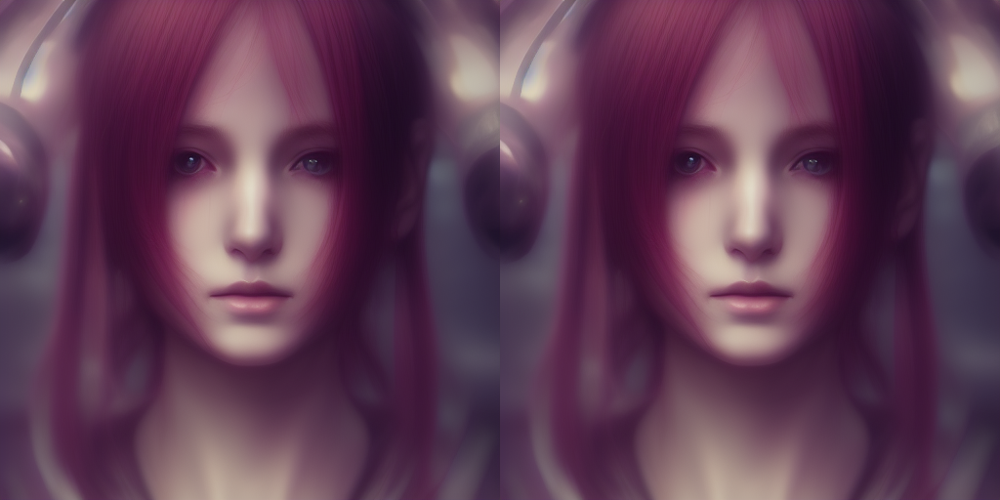

In [ ]:
#| server
image = PIL.Image.open("images/test_image.png")
grid = generate_image_grid([image] * 2, 1, 2)
grid

## get_image_size_from_aspect_ratio

In [ ]:
#| export
def get_image_size_from_aspect_ratio(aspect_ratio: float) -> Tuple[int, int]:
    base = 512
    width, height = (base, base)
    
    if aspect_ratio == 1:
        pass
    elif aspect_ratio < 1:
        height = base
        raw_width = round(height * aspect_ratio)
        multiplier = raw_width // 8
        width = 8 * multiplier
    elif aspect_ratio > 1:
        width = base
        raw_height = round(width / aspect_ratio)
        multiplier = raw_height // 8
        height = 8 * multiplier
    
    return (width, height)

In [ ]:
#| server
aspect_ratio = 0.6
width, height = get_image_size_from_aspect_ratio(aspect_ratio)
width, height

(304, 512)

## pil_to_b64

In [ ]:
#| export
def pil_to_b64(im: PIL.Image.Image, format="PNG") -> str:
    buffered = io.BytesIO()
    im.save(buffered, format=format)
    im_str = base64.b64encode(buffered.getvalue())
    return im_str.decode()

## b64_to_pil

In [ ]:
#| export
def b64_to_pil(b64: str, format="PNG") -> PIL.Image.Image:
    im = PIL.Image.open(io.BytesIO(base64.b64decode(b64)))
    try:
        im = im.convert(format)
    except ValueError:
        im = im.convert("RGB")
    
    return im

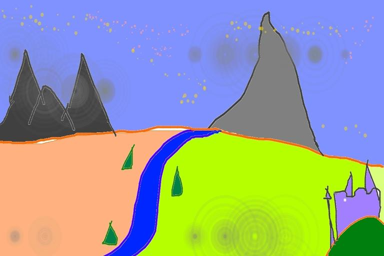

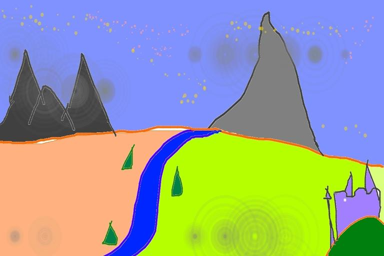

In [ ]:
#| server
im = PIL.Image.open("images/sketch-mountains-input.jpg")
display(im.resize((384, 256)))

b64 = pil_to_b64(im)
display(b64_to_pil(b64).resize((384, 256)))

## get_pipe_params_from_airt_req

In [ ]:
#| export
def get_pipe_params_from_airt_req(req: AIrtRequest, pipe: StableDiffusionPipeline) -> dict:
    pipe_accepted_param_keys = inspect.signature(pipe).parameters.keys()
    pipe_params = {
        k: v for k, v in req.__dict__.items()
        if k in pipe_accepted_param_keys
    }
    return pipe_params

# API models

## AIrtRequest

In [ ]:
#| export 
class Config:
    arbitrary_types_allowed = True

@pydantic.dataclasses.dataclass(config=Config)
class AIrtRequest:
    # inherit from `StableDiffusionPipeline`
    prompt: Union[str, List[str]]
    height: int = 512
    width: int = 512
    num_inference_steps: int = 30
    guidance_scale: float = 7.5
    negative_prompt: Union[List[str], str, None] = None
    num_images_per_prompt: Union[int, None] = 1
    eta: float = 0.0
        
    # inherif from `StableDiffusionImg2ImgPipeline`
    init_image: Union[torch.FloatTensor, PIL.Image.Image, str] = None # support b64
    strength: float = 0.8
    
    # custom parameters
    mode: str = "text2image"
    cmd: str = None
    steps: int = 0
    cfg: float = None
    batch_size: int = None
    seed: int = None
    aspect_ratio: float = 1
    scheduler: str = "euler_a"
    
    # https://pydantic-docs.helpmanual.io/usage/validators/
    @pydantic.validator('steps')
    def steps_must_be_at_least_one(cls, v):
        if not v:
            return v
        
        if v < 1:
            raise ValueError("steps must be at least 1")
        return v
    
    
    @pydantic.validator('scheduler')
    def scheduler_must_be_available(cls, v):
        if v and not v in SCHEDULERS:
            raise ValueError(f"{v} is not a valid key in {SCHEDULERS.keys()}")
        return v.lower().strip()
    
    
    # https://pydantic-docs.helpmanual.io/usage/dataclasses/#initialize-hooks
    def __post_init_post_parse__(self, **kwargs):
        param_alias = {
            "steps": "num_inference_steps",
            "batch_size": "num_images_per_prompt",
            "cfg": "guidance_scale",
        }
        
        for custom_p, pipe_p in param_alias.items():
            custom_v = getattr(self, custom_p)
            pipe_v = getattr(self, pipe_p)
            
            if custom_v and custom_v != pipe_v:
                setattr(self, pipe_p, custom_v)
                
        # aspect ratio
        ar = self.aspect_ratio
        if ar != 1:
            width, height = get_image_size_from_aspect_ratio(ar)
            self.width = width
            self.height = height    
            
        # init_image for i2i
        if isinstance(self.init_image, str):
            self.init_image = b64_to_pil(self.init_image)
        

## AIrtResponse

In [ ]:
from typing import OrderedDict

In [ ]:
#| export
@pydantic.dataclasses.dataclass
class AIrtResponse:
    images: List[str]
    seed: int = None
        
    def keys(self) -> dict:
        return self.__dict__.keys()

# Modes

- https://github.com/huggingface/diffusers/blob/main/docs/source/api/pipelines/stable_diffusion.mdx#tips

## text2image

In [ ]:
#| export
async def text2image(
    req: AIrtRequest, 
    return_pipe_out=False, 
    print_req=True
) -> Union[StableDiffusionPipelineOutput, AIrtResponse]:
    if print_req:
        pprint(req)
    
    generator = torch.Generator()
    seed = req.seed if req.seed else generator.seed()
    generator = torch.manual_seed(seed)
    
    scheduler_name = req.scheduler
    if scheduler_name:
        pipe.scheduler = SCHEDULERS[scheduler_name]
    
    pipe_params = get_pipe_params_from_airt_req(req, pipe)
    pipe_out = pipe(**pipe_params)
    
    # set back to default scheduler
    pipe.scheduler = DEFAULT_SCHEDULER
        
    b64images = [pil_to_b64(im) for im in pipe_out.images]
    
    if return_pipe_out:
        return pipe_out
    else:
        return AIrtResponse(
            images=b64images,
            seed=seed,
        )


AIrtRequest(prompt='portrait of a girl, anime, perfect face, cyberpunk, art by wlop, symmetric, realistic, 8k, vivid', height=512, width=512, num_inference_steps=10, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=None, strength=0.8, CUSTOM_PARAMS_START=True, mode='text2image', cmd=None, steps=10, cfg=7.5, batch_size=None, seed=16959009306137410145, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/10 [00:00<?, ?it/s]

<class 'diffusers.pipelines.stable_diffusion.StableDiffusionPipelineOutput'>
odict_keys(['images', 'text_input_ids', 'text_embeddings', 'uncond_embeddings', 'init_scaled_latents', 'all_latents', 'all_latents_x0'])


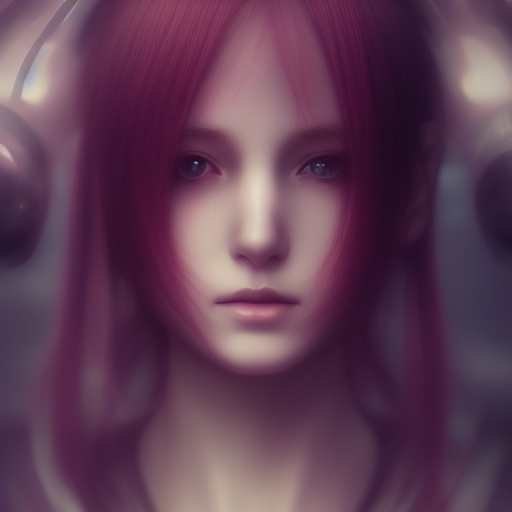

In [ ]:
#| server
req = AIrtRequest(
    prompt="portrait of a girl, anime, perfect face, cyberpunk, art by wlop, symmetric, realistic, 8k, vivid",
    seed=16959009306137410145,
    steps=10,
    cfg=7.5,    
#     aspect_ratio=0.5,
#     scheduler='euler_a'
)
task = text2image(req, return_pipe_out=True)
task_out = await task
print(type(task_out))
print(task_out.keys())
display(task_out['images'][0])

In [ ]:
#| server
task = text2image(req)
task_out = await task
print(type(task_out))
print(task_out.keys())

AIrtRequest(prompt='portrait of a girl, anime, perfect face, cyberpunk, art by wlop, symmetric, realistic, 8k, vivid', height=512, width=512, num_inference_steps=10, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=None, strength=0.8, CUSTOM_PARAMS_START=True, mode='text2image', cmd=None, steps=10, cfg=7.5, batch_size=None, seed=16959009306137410145, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/10 [00:00<?, ?it/s]

<class '__main__.AIrtResponse'>
dict_keys(['images', 'seed', '__pydantic_initialised__'])


AIrtRequest(prompt='Cristiano Ronaldo flying in the sky with a jetpack', height=512, width=512, num_inference_steps=30, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=None, strength=0.8, CUSTOM_PARAMS_START=True, mode='text2image', steps=0, cfg=None, batch_size=None, seed=477776924, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/30 [00:00<?, ?it/s]

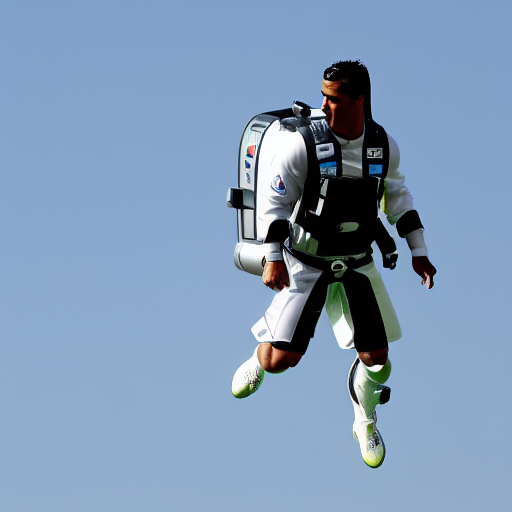

In [ ]:
#| server
req = AIrtRequest(
    prompt="Cristiano Ronaldo flying in the sky with a jetpack",
    seed=477776924,
#     steps=30,
#     cfg=7.5,    
#     scheduler='euler_a'
)
task = text2image(req, return_pipe_out=True)
task_out = await task
display(task_out['images'][0])

## image2image

In [ ]:
#| export
async def image2image(
    req: AIrtRequest, 
    return_pipe_out=False,
    print_req=True
) -> Union[StableDiffusionPipelineOutput, AIrtResponse]:
    if print_req:
        pprint(req)
        
    generator = torch.Generator()
    seed = req.seed if req.seed else generator.seed()
    generator = torch.manual_seed(seed)
    
    scheduler_name = req.scheduler
    if scheduler_name:
        pipe.scheduler = SCHEDULERS[scheduler_name]
    
    pipe_params = get_pipe_params_from_airt_req(req, i2i_pipe)
    pipe_out = i2i_pipe(**pipe_params)
    
    # set back to default scheduler
    pipe.scheduler = DEFAULT_SCHEDULER
        
    b64images = [pil_to_b64(im) for im in pipe_out.images]
    
    if return_pipe_out:
        return pipe_out
    else:
        return AIrtResponse(
            images=b64images,
            seed=seed,
        )    

AIrtRequest(prompt='A fantasy landscape, trending on artstation', height=512, width=512, num_inference_steps=50, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x512>, strength=0.75, CUSTOM_PARAMS_START=True, mode='text2image', cmd=None, steps=50, cfg=None, batch_size=None, seed=16959009306137410145, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/37 [00:00<?, ?it/s]

<class 'diffusers.pipelines.stable_diffusion.StableDiffusionPipelineOutput'>
odict_keys(['images', 'text_input_ids', 'text_embeddings', 'uncond_embeddings', 'init_scaled_latents', 'all_latents', 'all_latents_x0'])


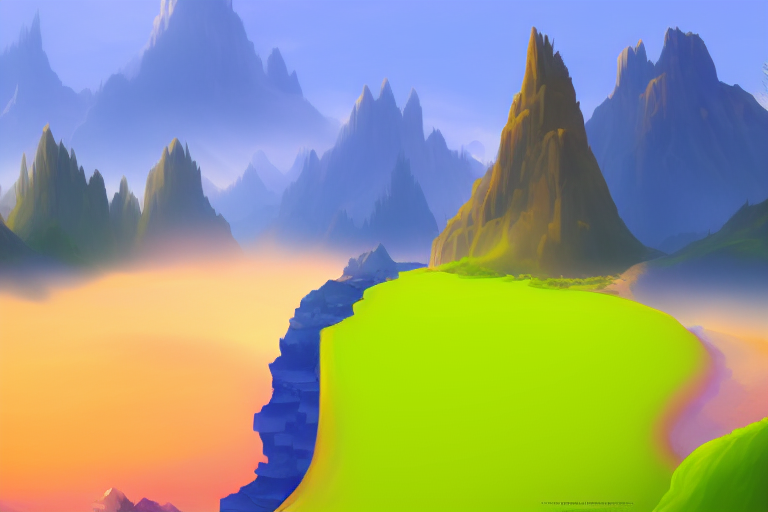

In [ ]:
#| server
req = AIrtRequest(
    prompt="A fantasy landscape, trending on artstation",
    seed=16959009306137410145,
    steps=50,
    strength=0.75,
    init_image=PIL.Image.open("images/sketch-mountains-input.jpg")
)
task = image2image(req, return_pipe_out=True)
task_out = await task
print(type(task_out))
print(task_out.keys())
display(task_out['images'][0])

# Pipeline callbacks

# API

## handle_airt_request

In [ ]:
#| export
async def handle_airt_request(req: AIrtRequest):
    pprint(req)
    mode = req.mode
    
    if mode == "text2image":
        return await text2image(req, print_req=False)
    elif mode == "image2image":
        return await image2image(req, print_req=False)
    else:
        raise NotImplementedError(req.mode)

### t2i

In [ ]:
#| server
req = AIrtRequest(
    prompt="portrait of a girl, anime, perfect face, cyberpunk, art by wlop, symmetric, realistic, 8k, vivid",
    seed=16959009306137410145,
    steps=10,
    cfg=7.5,    
)
task = handle_airt_request(req)
out = await task

AIrtRequest(prompt='portrait of a girl, anime, perfect face, cyberpunk, art by wlop, symmetric, realistic, 8k, vivid', height=512, width=512, num_inference_steps=10, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=None, strength=0.8, CUSTOM_PARAMS_START=True, mode='text2image', steps=10, cfg=7.5, batch_size=None, seed=16959009306137410145, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/10 [00:00<?, ?it/s]

### i2i

AIrtRequest(prompt='A fantasy landscape, trending on artstation', height=512, width=512, num_inference_steps=50, guidance_scale=7.5, negative_prompt=None, num_images_per_prompt=1, eta=0.0, init_image=<PIL.Image.Image image mode=RGB size=768x512>, strength=0.75, mode='text2image', cmd=None, steps=50, cfg=None, batch_size=None, seed=16959009306137410145, aspect_ratio=1.0, scheduler='euler_a')


  0%|          | 0/37 [00:00<?, ?it/s]

<class 'diffusers.pipelines.stable_diffusion.StableDiffusionPipelineOutput'>
odict_keys(['images', 'text_input_ids', 'text_embeddings', 'uncond_embeddings', 'init_scaled_latents', 'all_latents', 'all_latents_x0'])


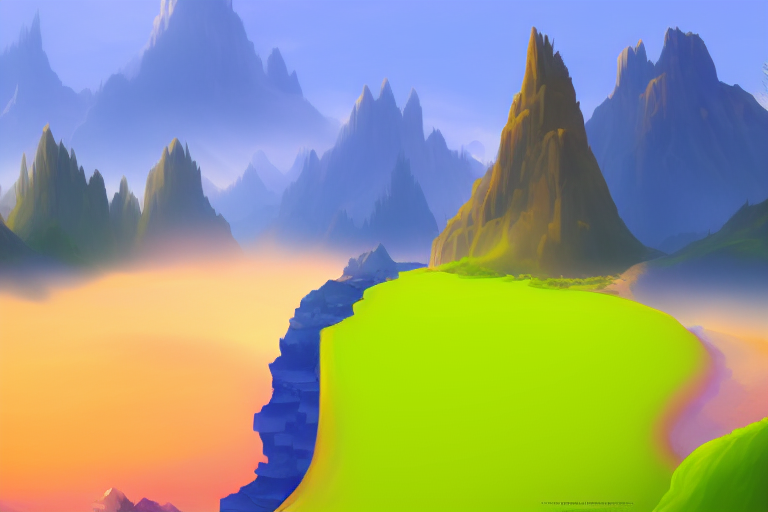

In [ ]:
#| server
im = PIL.Image.open("images/sketch-mountains-input.jpg")
b64 = pil_to_b64(im)

req = AIrtRequest(
    prompt="A fantasy landscape, trending on artstation",
    seed=16959009306137410145,
    steps=50,
    strength=0.75,
    init_image=b64
)
task = image2image(req, return_pipe_out=True)
task_out = await task
print(type(task_out))
print(task_out.keys())
display(task_out['images'][0])

# Playground

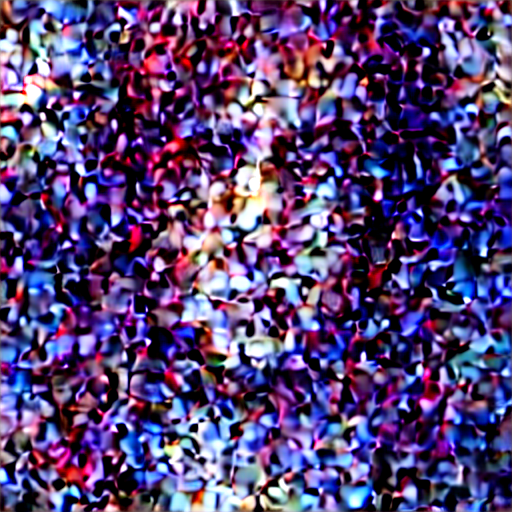

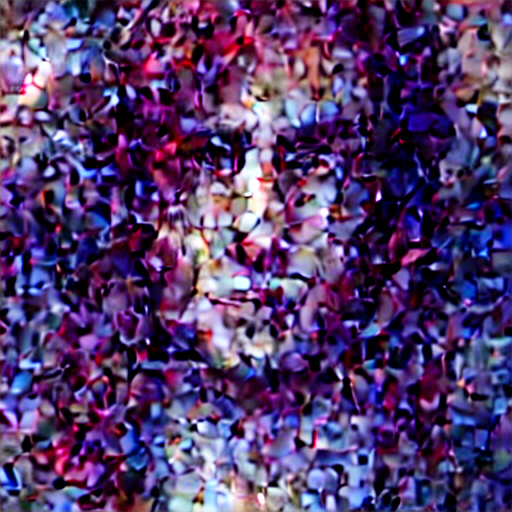

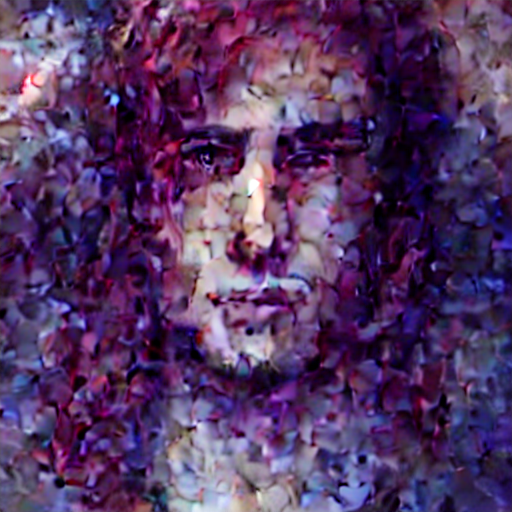

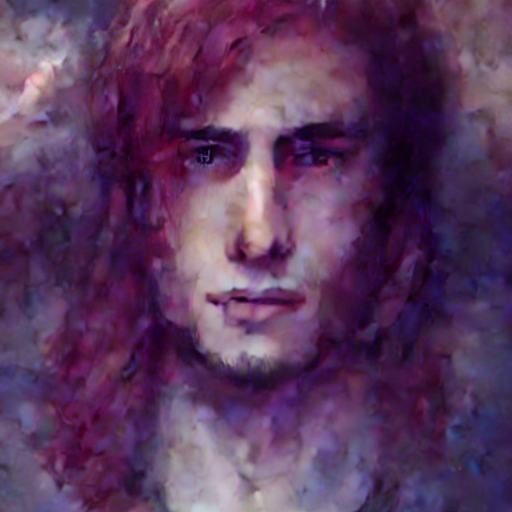

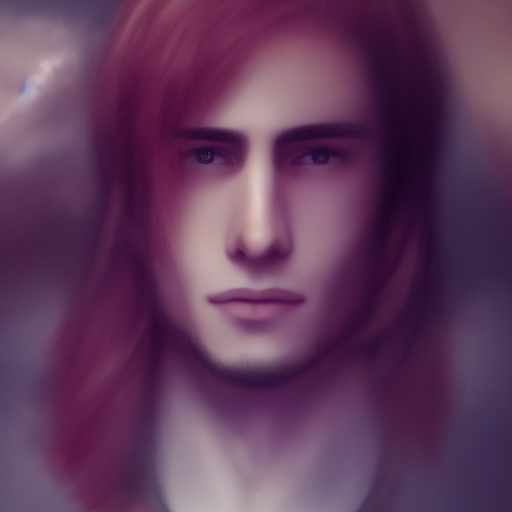

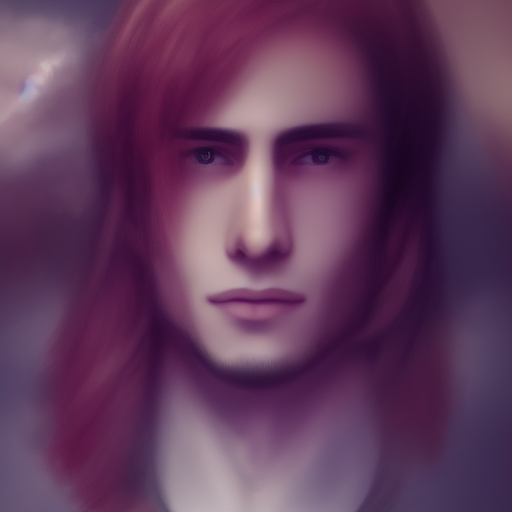

In [ ]:
for l in pipe_out.all_latents:
    display(latents_to_pil(l)[0])

In [ ]:
pipe_out.keys()

odict_keys(['images', 'text_input_ids', 'text_embeddings', 'uncond_embeddings', 'init_scaled_latents', 'all_latents', 'all_latents_x0'])

In [ ]:
pipe.device.type

'cuda'

In [ ]:
scheduler.step?

Signature:
scheduler.step(
    model_output: torch.FloatTensor,
    timestep: Union[float, torch.FloatTensor],
    sample: torch.FloatTensor,
    generator: Union[torch._C.Generator, NoneType] = None,
    return_dict: bool = True,
) -> Union[diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteSchedulerOutput, Tuple]
Docstring:
Predict the sample at the previous timestep by reversing the SDE. Core function to propagate the diffusion
process from the learned model outputs (most often the predicted noise).

Args:
    model_output (`torch.FloatTensor`): direct output from learned diffusion model.
    timestep (`float`): current timestep in the diffusion chain.
    sample (`torch.FloatTensor`):
        current instance of sample being created by diffusion process.
    generator (`torch.Generator`, optional): Random number generator.
    return_dict (`bool`): option for returning tuple rather than EulerAncestralDiscreteSchedulerOutput class

Returns:
    [`~schedul

# maunal

In [ ]:
text_input = tokenizer(
    prompt, 
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

In [ ]:
tokenizer.model_max_length

77

In [ ]:
text_input

{'input_ids': tensor([[49406,  6469,  1611,   335,   269,   320,   269,  2322, 27846, 12609,
           537, 11124,  7997, 16157,  1994, 12609, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
input_ids = text_input['input_ids'][0]
for token_id in input_ids:
    token = tokenizer.decode(token_id)
    print(token_id, token)
    
    if token_id == tokenizer.eos_token_id:
        
        break

tensor(49406) <|startoftext|>
tensor(6469) anime
tensor(1611) girl
tensor(335) p
tensor(269) .
tensor(320) a
tensor(269) .
tensor(2322) works
tensor(27846) insanely
tensor(12609) detailed
tensor(537) and
tensor(11124) elegant
tensor(7997) hyper
tensor(16157) realistic
tensor(1994) super
tensor(12609) detailed
tensor(49407) <|endoftext|>


In [ ]:
with torch.no_grad():
    text_out = text_encoder(text_input.input_ids.to(device))

In [ ]:
type(text_out), len(text_out)

(transformers.modeling_outputs.BaseModelOutputWithPooling, 2)

In [ ]:
text_emb = text_out[0]
text_emb.shape

torch.Size([1, 77, 768])

In [ ]:
text_out[1].shape

torch.Size([1, 768])

In [ ]:
max_length = text_input.input_ids.shape[-1]
max_length

77

In [ ]:
vocab = tokenizer.get_vocab()
len(vocab)

49408

In [ ]:
tokenizer("")

{'input_ids': [49406, 49407], 'attention_mask': [1, 1]}

In [ ]:
tokenizer.decode([49406, 49407])

'<|startoftext|><|endoftext|>'

In [ ]:
uncond_input = tokenizer(
    [""] * batch_size,
    padding="max_length",
    max_length=max_length,
    return_tensors="pt"
)
uncond_input

{'input_ids': tensor([[49406, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
with torch.no_grad():
    uncond_emb = text_encoder(uncond_input.input_ids.to(device))[0] 

uncond_emb.shape

torch.Size([1, 77, 768])

In [ ]:
text_emb.shape

torch.Size([1, 77, 768])

In [ ]:
concat_emb = torch.cat([uncond_emb, text_emb])
concat_emb.shape

torch.Size([2, 77, 768])

In [ ]:
steps

20

In [ ]:
orig_timesteps = scheduler.timesteps
orig_timesteps.shape

torch.Size([20])

In [ ]:
scheduler.set_timesteps(steps)
scheduler.timesteps

tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000],
       dtype=torch.float64)

In [ ]:
unet.in_channels, unet.out_channels

(4, 4)

In [ ]:
# generator.seed()

In [ ]:
# i = 6,820,215,742,699,044
# i // 

In [ ]:
seed

5231061940132053

In [ ]:
# generator = torch.Generator(device=device)
generator.manual_seed(seed)

<torch._C.Generator>

In [ ]:
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8), 
    generator=generator,
    device=device,
#     dtype=torch.float32
    dtype=torch.float16
)

init_latents = torch.clone(latents)

In [ ]:
init_latents.dtype, init_latents.device

(torch.float16, device(type='cuda', index=0))

In [ ]:
latents.shape

torch.Size([1, 4, 64, 64])

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

In [ ]:
latents[0, :1, :4, :4]

tensor([[[-0.0444, -1.2324, -0.5576,  0.2068],
         [ 0.1603, -1.0068, -1.3232, -0.7686],
         [ 2.0352,  0.8027, -0.0609,  0.8945],
         [-1.0713, -0.6875,  0.1897, -0.8311]]], device='cuda:0',
       dtype=torch.float16)

In [ ]:
latents = latents * scheduler.init_noise_sigma
latents[0, :1, :4, :4]

tensor([[[ -0.6489, -18.0156,  -8.1484,   3.0215],
         [  2.3418, -14.7109, -19.3438, -11.2344],
         [ 29.7500,  11.7344,  -0.8892,  13.0703],
         [-15.6562, -10.0469,   2.7715, -12.1484]]], device='cuda:0',
       dtype=torch.float16)

In [ ]:
latents.shape

torch.Size([1, 4, 64, 64])

In [ ]:
scheduler.timesteps

tensor([999.0000, 946.4211, 893.8421, 841.2632, 788.6842, 736.1053, 683.5263,
        630.9474, 578.3684, 525.7895, 473.2105, 420.6316, 368.0526, 315.4737,
        262.8947, 210.3158, 157.7368, 105.1579,  52.5789,   0.0000],
       dtype=torch.float64)

In [ ]:
with autocast(device):
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        
        latent_model_input = torch.cat([latents] * 2)
#         print(latent_model_input.shape)

        sigma = scheduler.sigmas[i]
#         print(f'index {i}, timestep: {t}, sigma: {sigma}')
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)
        
        with torch.no_grad():
            unet_out = unet(latent_model_input, t, encoder_hidden_states=concat_emb)
            noise_pred = unet_out.sample
#             print(noise_pred.shape)
            
        noise_pred_uncond, noise_pred_txt = noise_pred.chunk(2)
#         print('perform guidance')
        noise_pred = noise_pred_uncond + cfg * (noise_pred_txt - noise_pred_uncond)
        
        
        latents = scheduler.step(noise_pred, t, latents).prev_sample
        
    

0it [00:00, ?it/s]

In [ ]:
latents[0, :1, :4, :4]

tensor([[[-0.2081, -0.1071, -0.1375, -0.1310],
         [-0.2744,  0.0636,  0.0082,  0.2245],
         [-0.1522,  0.1300,  0.0346,  0.0796],
         [-0.2289,  0.1230, -0.1796,  0.2163]]], device='cuda:0',
       dtype=torch.float16)

In [ ]:
latents = 1 / 0.18215 * latents

In [ ]:
latents[0, :1, :4, :4]

tensor([[[-1.1426, -0.5879, -0.7544, -0.7192],
         [-1.5068,  0.3491,  0.0448,  1.2324],
         [-0.8359,  0.7139,  0.1898,  0.4370],
         [-1.2568,  0.6753, -0.9858,  1.1875]]], device='cuda:0',
       dtype=torch.float16)

In [ ]:
with autocast(device):
    with torch.no_grad():
        vae_out = vae.decode(latents)

In [ ]:
img = vae_out.sample
img.shape

torch.Size([1, 3, 512, 512])

In [ ]:
img.min(), img.max()

(tensor(-0.7554, device='cuda:0', dtype=torch.float16),
 tensor(0.9922, device='cuda:0', dtype=torch.float16))

In [ ]:
img = (img / 2 + 0.5).clamp(0, 1)
img = img.detach().cpu().permute(0, 2, 3, 1).numpy()
img = (img * 255).round().astype("uint8")
img.shape

(1, 512, 512, 3)

In [ ]:
pil_imgs = [PIL.Image.fromarray(im) for im in img]

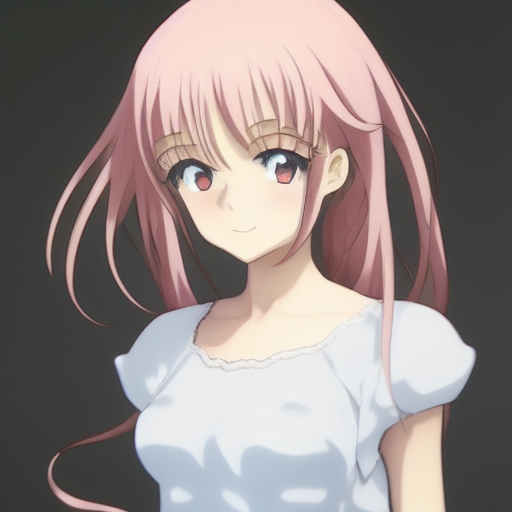

In [ ]:
pil_imgs[0]

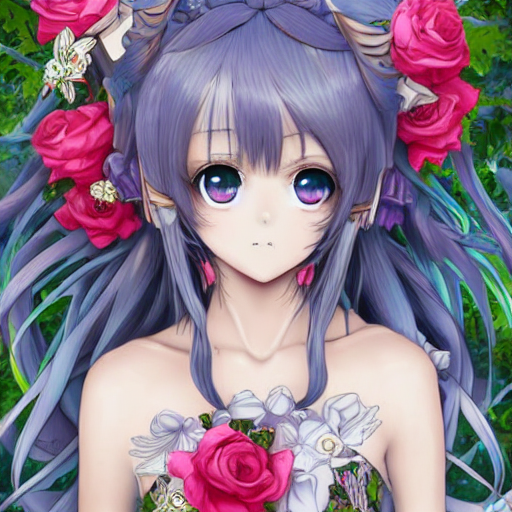

In [ ]:
pipe_out.images[0]

In [ ]:
im = pipe_out.images[0]
im.save("test.png")

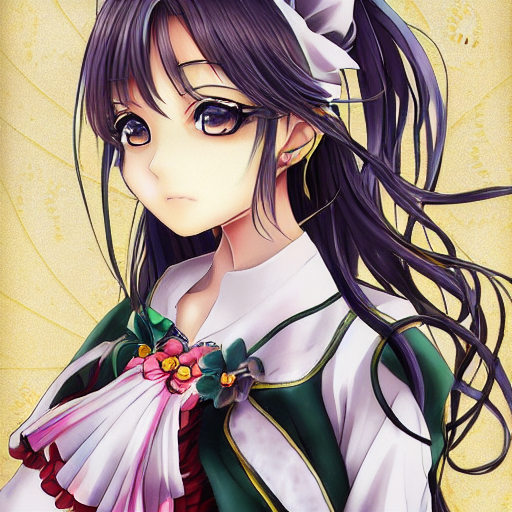

In [ ]:
pil_img = PIL.Image.open("test.png")
pil_img

In [ ]:
im = tfms.ToTensor()(pil_img)
im.shape

torch.Size([3, 512, 512])

In [ ]:
batch_im = im.unsqueeze(0).to(device) *2 - 1
batch_im.shape

torch.Size([1, 3, 512, 512])

In [ ]:
with torch.no_grad():
    vae_out = vae.encode(batch_im)
vae_out

AutoencoderKLOutput(latent_dist=<diffusers.models.vae.DiagonalGaussianDistribution object>)

In [ ]:
latent_dist = vae_out.latent_dist

In [ ]:
encoded = latent_dist.sample() * 0.18215
encoded.shape

torch.Size([1, 4, 64, 64])

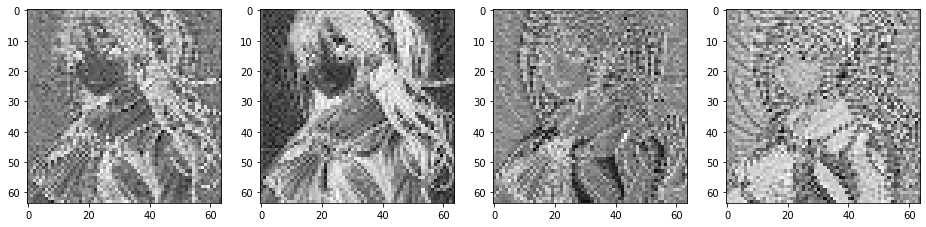

In [ ]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(encoded[0][c].cpu(), cmap='Greys')

In [ ]:
scaled_encoded = (1 / 0.18215) * encoded
with torch.no_grad():
    decoded = vae.decode(scaled_encoded).sample

decoded.shape

torch.Size([1, 3, 512, 512])

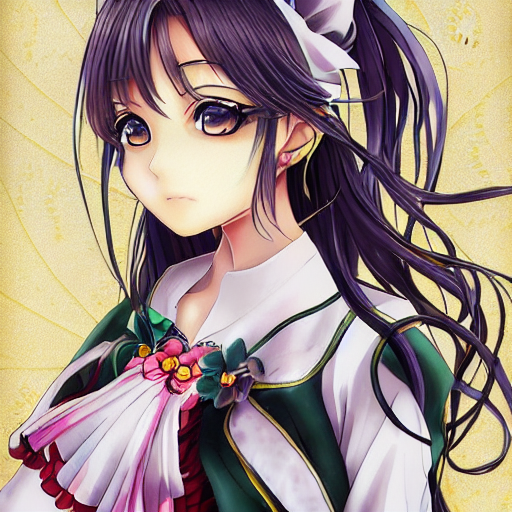

In [ ]:
decoded = (decoded / 2 + 0.5).clamp(0, 1)
decoded = decoded.detach().cpu().permute(0, 2, 3, 1).numpy()
decoded = (decoded * 255).round().astype("uint8")
pil_im = [PIL.Image.fromarray(i) for i in decoded]
pil_im[0]

In [ ]:
encoded.shape

torch.Size([1, 4, 64, 64])

In [ ]:
noise = torch.randn_like(encoded)

In [ ]:
scheduler.set_timesteps(15)

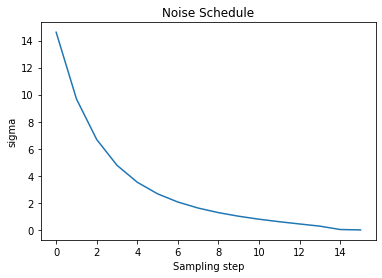

In [ ]:
plt.plot(scheduler.sigmas)
plt.title('Noise Schedule')
plt.xlabel('Sampling step')
plt.ylabel('sigma')
plt.show()

In [ ]:
sampling_step = 10
scheduler.timesteps[sampling_step]

tensor(285.4286, device='cuda:0', dtype=torch.float64)

In [ ]:
scheduler.sigmas[sampling_step]

tensor(0.7913, device='cuda:0')

In [ ]:
encoded_and_noised = scheduler.add_noise(
    encoded, 
    noise, 
    timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))

encoded_and_noised.shape

torch.Size([1, 4, 64, 64])

In [ ]:
def latent_to_pil(l):
    l = (1 / 0.18215) * l
    with torch.no_grad():
        decoded = vae.decode(l).sample
#     print(decoded.shape)
    
    img = (decoded / 2 + 0.5).clamp(0, 1)
    img = img.detach().cpu().permute(0, 2, 3, 1).numpy()
    img = (img * 255).round().astype("uint8")
    pil_imgs = [PIL.Image.fromarray(i) for i in img]
    return pil_imgs[0]
    

torch.Size([1, 3, 512, 512])


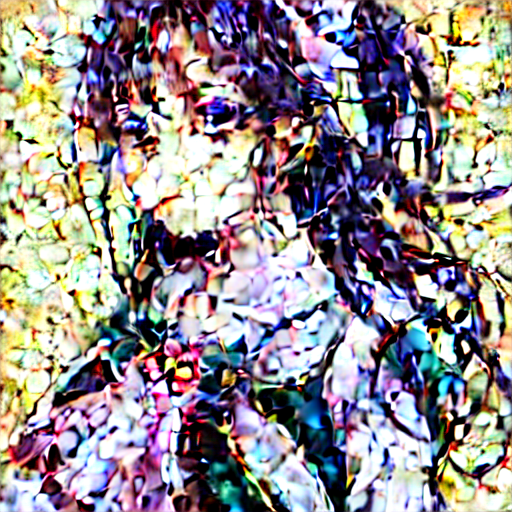

In [ ]:
latent_to_pil(encoded_and_noised)

In [ ]:
scheduler.add_noise??

Signature:
scheduler.add_noise(
    original_samples: torch.FloatTensor,
    noise: torch.FloatTensor,
    timesteps: torch.FloatTensor,
) -> torch.FloatTensor
Docstring: <no docstring>
Source:   
    def add_noise(
        self,
        original_samples: torch.FloatTensor,
        noise: torch.FloatTensor,
        timesteps: torch.FloatTensor,
    ) -> torch.FloatTensor:
        # Make sure sigmas and timesteps have the same device and dtype as original_samples
        self.sigmas = self.sigmas.to(device=original_samples.device, dtype=original_samples.dtype)
        if original_samples.device.type == "mps" and torch.is_floating_point(timesteps):
            # mps does not support float64
            self.timesteps = self.timesteps.to(original_samples.device, dtype=torch.float32)
            timesteps = timesteps.to(original_samples.device, dtype=torch.float32)
        else:
            self.timesteps = self.timesteps.to(original_samples.device)
            timesteps = timesteps.to(ori

In [ ]:
manual_encoded_and_noised = encoded \
    + torch.rand_like(encoded) * scheduler.sigmas[sampling_step]

torch.Size([1, 3, 512, 512])


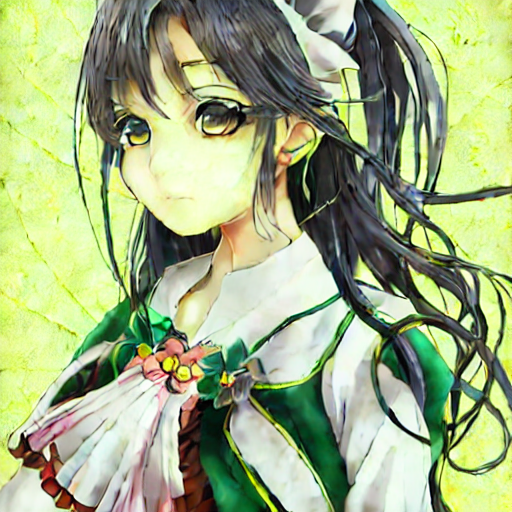

In [ ]:
latent_to_pil(manual_encoded_and_noised)

In [ ]:
new_prompt = prompt.replace('girl', 'boy')
new_prompt

'anime boy P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

torch.Size([1, 3, 512, 512])


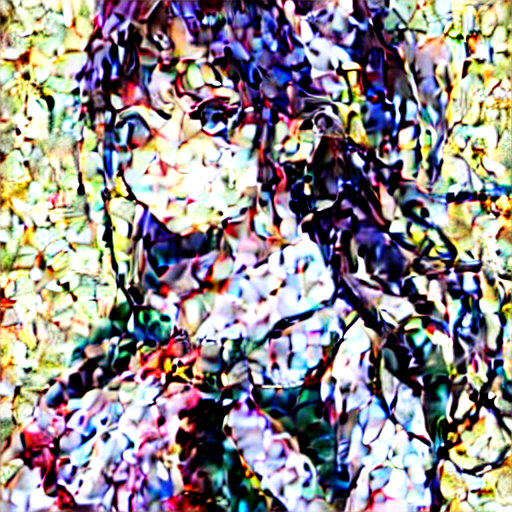

In [ ]:
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50           # Number of denoising steps
guidance_scale = 8                  # Scale for classifier-free guidance
batch_size = 1

torch.manual_seed(seed)

# Prep text (same as before)
text_input = tokenizer(new_prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler (setting the number of inference steps)
scheduler.set_timesteps(num_inference_steps)

# Prep latents (noising appropriately for start_step)
start_step = 35
start_sigma = scheduler.sigmas[start_step]
noise = torch.randn_like(encoded)
latents = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
latents = latents.to(torch_device).float()
latent_to_pil(latents)

In [ ]:
# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    
    if i > start_step: # << This is the only modification to the loop we do
        
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample
    else:
        pass

0it [00:00, ?it/s]

torch.Size([1, 3, 512, 512])


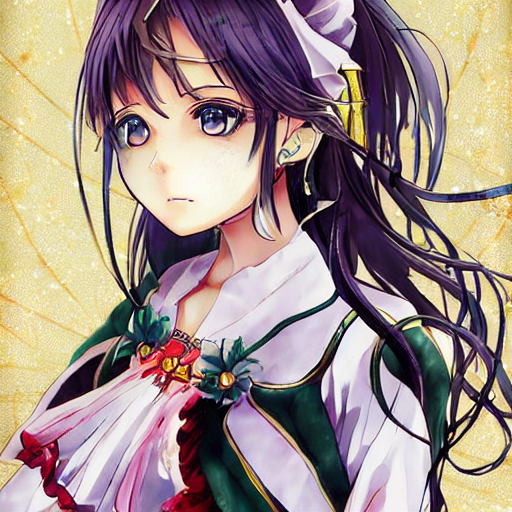

In [ ]:
latent_to_pil(latents)

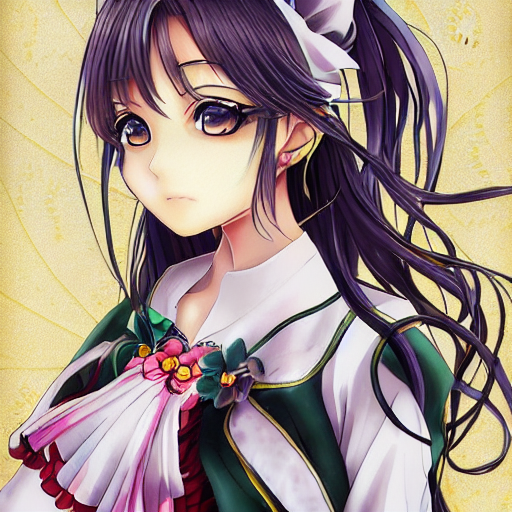

In [ ]:
pil_im[0]

In [ ]:
p = new_prompt
p

'anime boy P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

In [ ]:
txt_input = tokenizer(p, 
                      padding="max_length", 
                      max_length=tokenizer.model_max_length, 
                      truncation=True, 
                      return_tensors="pt")


input_ids = txt_input['input_ids'][0]
input_ids

tensor([49406,  6469,  1876,   335,   269,   320,   269,  2322, 27846, 12609,
          537, 29616,  7997, 19892,  3320, 11124, 46865, 22146, 16157,  1994,
        12609, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407])

In [ ]:
for token_id in input_ids:
    if token_id == tokenizer.eos_token_id: break
    print(token_id, tokenizer.decode(token_id))


tensor(49406) <|startoftext|>
tensor(6469) anime
tensor(1876) boy
tensor(335) p
tensor(269) .
tensor(320) a
tensor(269) .
tensor(2322) works
tensor(27846) insanely
tensor(12609) detailed
tensor(537) and
tensor(29616) intricate
tensor(7997) hyper
tensor(19892) maxim
tensor(3320) alist
tensor(11124) elegant
tensor(46865) ornate
tensor(22146) hyper
tensor(16157) realistic
tensor(1994) super
tensor(12609) detailed


In [ ]:
text_encoder.text_model.embeddings

CLIPTextEmbeddings(
  (token_embedding): Embedding(49408, 768)
  (position_embedding): Embedding(77, 768)
)

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

## The UNET and CFG

In [ ]:
scheduler.set_timesteps(50)

t = scheduler.timesteps[0]
sigma = scheduler.sigmas[0]
scheduler.timesteps

tensor([999.0000, 978.6122, 958.2245, 937.8367, 917.4490, 897.0612, 876.6735,
        856.2857, 835.8980, 815.5102, 795.1224, 774.7347, 754.3469, 733.9592,
        713.5714, 693.1837, 672.7959, 652.4082, 632.0204, 611.6327, 591.2449,
        570.8571, 550.4694, 530.0816, 509.6939, 489.3061, 468.9184, 448.5306,
        428.1429, 407.7551, 387.3673, 366.9796, 346.5918, 326.2041, 305.8163,
        285.4286, 265.0408, 244.6531, 224.2653, 203.8776, 183.4898, 163.1020,
        142.7143, 122.3265, 101.9388,  81.5510,  61.1633,  40.7755,  20.3878,
          0.0000], dtype=torch.float64)

In [ ]:
t, sigma

(tensor(999., dtype=torch.float64), tensor(14.6146))

In [ ]:
torch.manual_seed(seed)
latent = torch.randn((1, unet.in_channels, height // 8, width // 8))

In [ ]:
latent.device

device(type='cpu')

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

In [ ]:
latent = latent.to(device)
latent = latent * scheduler.init_noise_sigma

In [ ]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, 
                       truncation=True, return_tensors="pt"
                      )

In [ ]:
text_input

{'input_ids': tensor([[49406,  6469,  1611,   335,   269,   320,   269,  2322, 27846, 12609,
           537, 29616,  7997, 19892,  3320, 11124, 46865, 22146, 16157,  1994,
         12609, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
with torch.no_grad():
    text_emb = text_encoder(text_input.input_ids.to(device))[0]

In [ ]:
with torch.no_grad():
    noise_pred = unet(latent, t, encoder_hidden_states=text_emb)['sample']

In [ ]:
noise_pred.shape

torch.Size([1, 4, 64, 64])

torch.Size([1, 3, 512, 512])


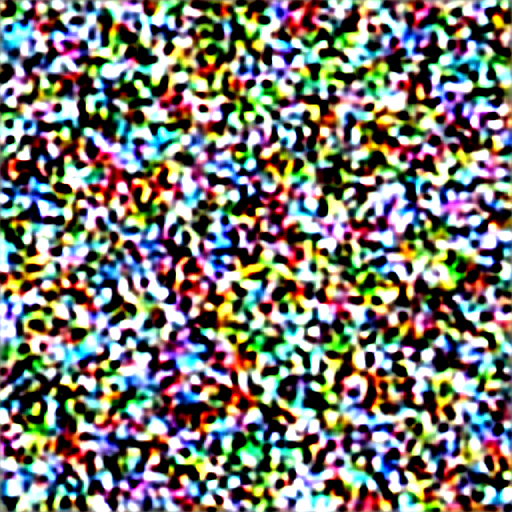

In [ ]:
latent_to_pil(latent - noise_pred)

In [ ]:
prompt

'anime girl P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

In [ ]:
from PIL import Image

In [ ]:
guidance_scale = 7.5

In [ ]:
seed

204103447

In [ ]:
!rm -rf steps/
!mkdir -p steps/

# Prep text 
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# torch.manual_seed(seed)
generator.manual_seed(seed)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
#   generator=generator,
    device=device
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    # Get the predicted x0:
    # latents_x0 = latents - sigma * noise_pred # Calculating ourselves
    latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample # Using the scheduler (Diffusers 0.4 and above)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample

    # To PIL Images
    im_t0 = latent_to_pil(latents_x0)
    im_next = latent_to_pil(latents)

    # Combine the two images and save for later viewing
    im = PIL.Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))
    im.paste(im_t0, (512, 0))
    im.save(f'steps/{i:04}.jpeg')

0it [00:00, ?it/s]

In [ ]:
# Make and show the progress video (change width to 1024 for full res)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + base64.b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
# scheduler.step??

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()